# Plans:
- Get details of images
- Check validity of annotations
    - Check that the number of label files matches the number of images
    - Inspect some images and check whether the bounding box/es have been done correctly
- Check splitting of dataset is done correctly
    - Count number of images in train and test set


### Just some info about losses that was displayed on the tensorboard

https://www.mdpi.com/2072-666X/12/11/1273/pdf 

box_loss: Bounding-Box Regression Loss
- adsad

cls_loss: 
- classification loss

obj_loss: 
- sfef

confidence loss?

### Check Classes in folder

The directory for images & labels
C:\Users\Jansen-Lin\aiap_gitlab\mini_project\2022-06-08_from_yong_quan\YOLOv5\data\taco

Images > test
       > train

labels > test
       > train
       

In [2]:
import os

In [15]:
data_dir = 'data\\taco\\images\\'
len_train = len(os.listdir(data_dir + 'train'))
len_test = len(os.listdir(data_dir + 'test'))
print('No. of Train samples:', len_train)
print('No. of  Val  samples:', len_test)
total = len_train + len_test
print('Train : Val')
print(f'{round(len_train/total*100, 1)}' + '  : ' + f'{round(len_test/total*100, 1)}')

No. of Train samples: 1415
No. of  Val  samples: 142
Train : Val
90.9  : 9.1


### Get details of images

In [100]:
class_dict_ =  {0: 'Aluminium Foil',
                1: 'Bottle',
                2: 'Bottle Cap',
                3: 'Can',
                4: 'Carton',
                5: 'Cup',
                6: 'Food Waste',
                7: 'Other Plastic',
                8: 'Paper Trash',
                9: 'Plastic Trash',
                10: 'Unlabeled Litter',
                11: 'Cigarette'}

In [32]:
from PIL import Image
import numpy as np
import pandas as pd

In [33]:
# Initialise lists
list_dataset = []
list_img_name =[]
list_num_obj = []
list_format = []
list_mode = []
list_format_mode =[]
list_height = []
list_width = []
list_aspect_ratio = []
list_aspect_ratio_max = []


In [34]:
for dataset in os.listdir('data\\taco\\images'):
    for img_name in os.listdir('data\\taco\\images\\' + dataset):
        # Get dataset type (train or test)
        list_dataset.append(dataset)
        # Get image name
        list_img_name.append(img_name)
        # Get format of image
        list_format.append(img_name.split('.')[-1])
        # Open image to extract more details
        img = Image.open('data\\taco\\images\\' + dataset + '\\' + img_name)
        width, height = img.size
        # Get mode of image
        list_mode.append(img.mode)
        # Get format_mode
        list_format_mode.append(img_name.split('.')[-1] + '_' + img.mode)
        # Get width
        list_width.append(width)
        # Get height
        list_height.append(height)
        # Get aspect ratio of image
        list_aspect_ratio.append(width/height)
        list_aspect_ratio_max.append(np.maximum(width/height,height/width))
        



In [35]:
images_profiles = pd.DataFrame(data={'dataset': list_dataset,
                                     'img_name': list_img_name,
                                     'format': list_format,
                                     'mode': list_mode,
                                     'format_mode': list_format_mode,
                                     'width': list_width,
                                     'height': list_height,
                                     'aspect_ratio': list_aspect_ratio,
                                     'aspect_ratio_max':list_aspect_ratio_max
                                    })

In [36]:
images_profiles

,dataset,img_name,format,mode,format_mode,width,height,aspect_ratio,aspect_ratio_max
0,test,batch_10_000008.jpg,jpg,RGB,jpg_RGB,1824,4000,0.456000,2.192982
1,test,batch_10_000054.jpg,jpg,RGB,jpg_RGB,1824,4000,0.456000,2.192982
2,test,batch_10_000071.jpg,jpg,RGB,jpg_RGB,1824,4000,0.456000,2.192982
3,test,batch_10_000084.jpg,jpg,RGB,jpg_RGB,1824,4000,0.456000,2.192982
4,test,batch_11_000008.jpg,jpg,RGB,jpg_RGB,1824,4000,0.456000,2.192982
...,...,...,...,...,...,...,...,...,...
1552,train,batch_9_000094.jpg,jpg,RGB,jpg_RGB,4000,1824,2.192982,2.192982
1553,train,batch_9_000095.jpg,jpg,RGB,jpg_RGB,1824,4000,0.456000,2.192982
1554,train,batch_9_000097.jpg,jpg,RGB,jpg_RGB,4000,1824,2.192982,2.192982
1555,train,batch_9_000098.jpg,jpg,RGB,jpg_RGB,1824,4000,0.456000,2.192982


In [37]:
images_profiles.to_csv('images_profiles.csv',index=False)

### EDA on images profiles

In [38]:
images_profiles.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1557 entries, 0 to 1556
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   dataset           1557 non-null   object 
 1   img_name          1557 non-null   object 
 2   format            1557 non-null   object 
 3   mode              1557 non-null   object 
 4   format_mode       1557 non-null   object 
 5   width             1557 non-null   int64  
 6   height            1557 non-null   int64  
 7   aspect_ratio      1557 non-null   float64
 8   aspect_ratio_max  1557 non-null   float64
dtypes: float64(2), int64(2), object(5)
memory usage: 109.6+ KB


#### Check categorical features

In [39]:
df = images_profiles.copy()

In [40]:
# Get a list of categorical features
features_obj = list(df.columns[df.dtypes == 'object'])
features_obj

['dataset', 'img_name', 'format', 'mode', 'format_mode']

In [46]:
import matplotlib.pyplot as plt
import seaborn as sns

In [47]:
def countplot_cat_features(df,features_obj:list):
    """ 
    Generate count plots for categorical features
    
    param df: the dataset in dataframe format
    param features_obj: list of feature names
    """
    for feature in features_obj:
        ax = sns.countplot(x=feature, data=df)
        ax.tick_params(axis='x', rotation=90)
        plt.show()

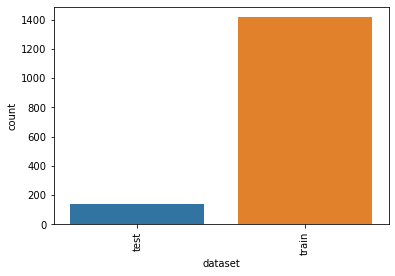

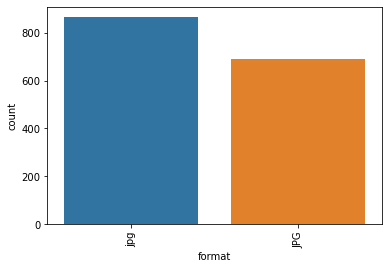

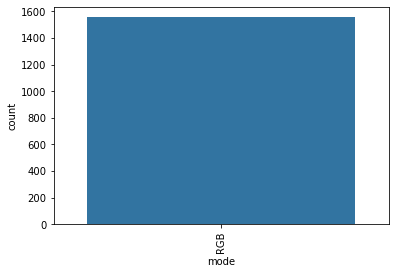

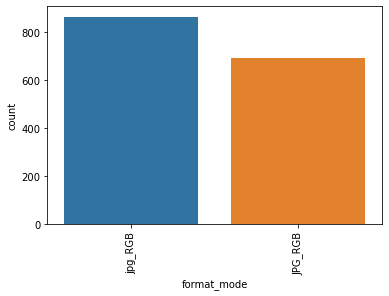

In [72]:
countplot_cat_features(df, [features_obj[0]] + features_obj[2:])

#### Check continuous features

In [73]:
images_profiles.describe().T

,count,mean,std,min,25%,50%,75%,max
width,1557.0,2970.637765,920.761906,842.000,2448.000000,2624.000000,3264.000000,6000.000000
height,1557.0,3071.545922,675.728286,474.000,2448.000000,3264.000000,3264.000000,4618.000000
aspect_ratio,1557.0,1.023040,0.405320,0.456,0.750000,0.750000,1.333333,2.192982
aspect_ratio_max,1557.0,1.449233,0.271361,1.000,1.333333,1.333333,1.333333,2.192982


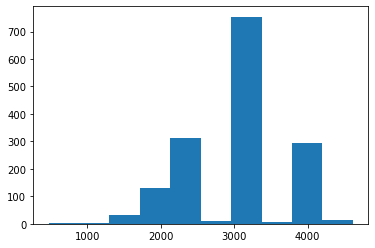

In [74]:
plt.hist(images_profiles['height'])
plt.show()

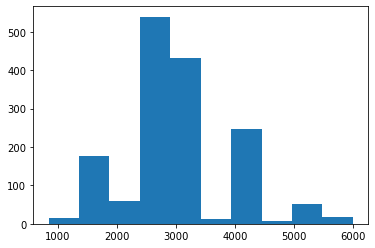

In [75]:
plt.hist(images_profiles['width'])
plt.show()

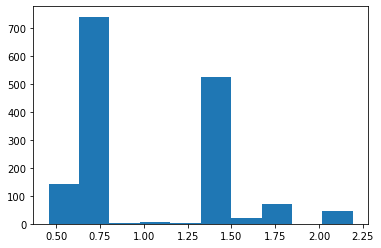

In [76]:
plt.hist(images_profiles['aspect_ratio'])
plt.show()

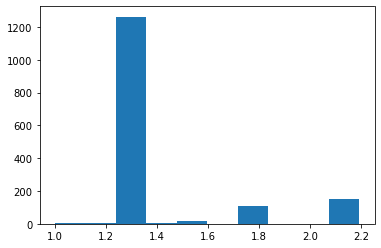

In [77]:
plt.hist(images_profiles['aspect_ratio_max'])
plt.show()

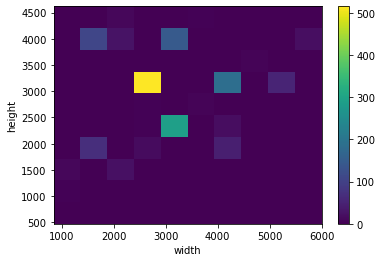

In [78]:
plt.hist2d(images_profiles['width'], images_profiles['height'])
plt.xlabel('width')
plt.ylabel('height')
plt.colorbar()
plt.show()

### Check annotation of objects 

#### Check if all images are annotated

In [95]:
# Get list of images file name
img_train_list = os.listdir('data\\taco\\images\\train')
img_train_list = [img_name[:-4] for img_name in img_train_list]

In [96]:
img_test_list = os.listdir('data\\taco\\images\\test')
img_test_list = [img_name[:-4] for img_name in img_test_list]

In [ ]:
# Get list of annotation file name
os.listdir('')

### Check validity of annotations

The 
https://albumentations.ai/docs/getting_started/bounding_boxes_augmentation/

In [7]:
import os

root_dir = os.getcwd()
os.getcwd()

'c:\\Users\\Jansen-Lin\\aiap_gitlab\\mini_project\\2022-06-08_from_yong_quan\\YOLOv5'

In [8]:
import PIL

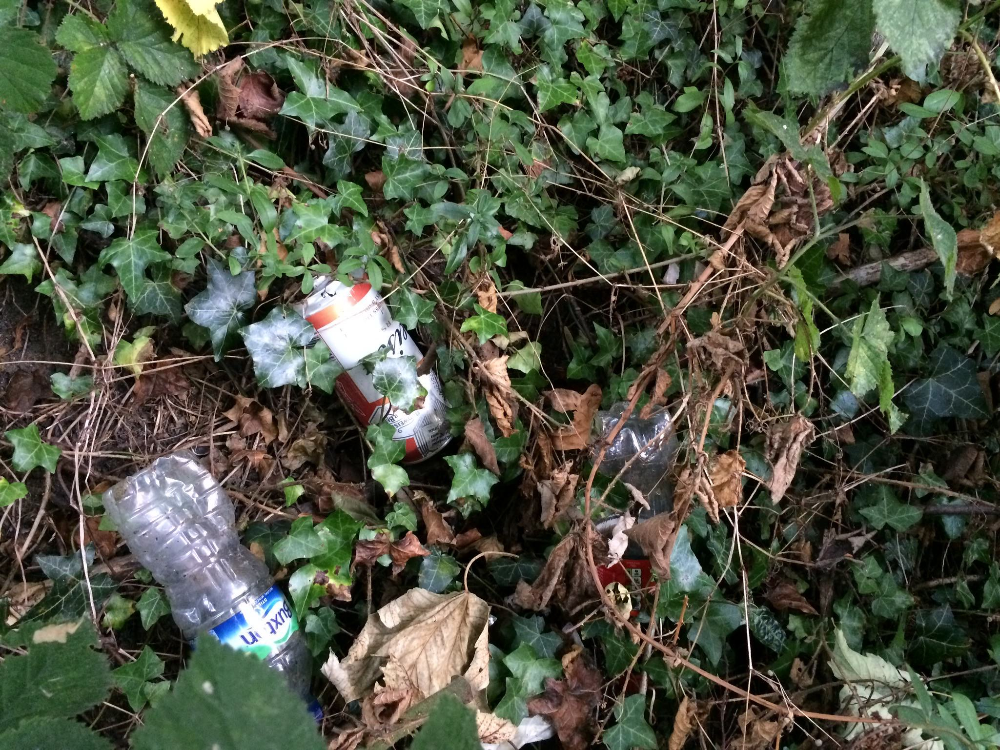

In [12]:
from PIL import Image
im = Image.open(root_dir + '\\data\\taco\\images\\train\\batch_1_000019.jpg')
im

In [72]:
f = open(root_dir + '\\data\\taco\\labels\\train\\batch_1_000019.txt', "r")
string = f.readlines()
string

['1 0.212787 0.781392 0.221571 0.365647\n',
 '1 0.635188 0.679896 0.08736 0.290176\n',
 '2 0.316496 0.950878 0.014153 0.025374\n',
 '3 0.370669 0.488289 0.166423 0.2635\n']

In [74]:
with open(root_dir + '\\data\\taco\\labels\\train\\batch_1_000019.txt', "r") as f:
    string = f.readlines()

In [78]:
# Remove the escape character for new line
string_2 = [line[0:-1] for line in string]
string_2

['1 0.212787 0.781392 0.221571 0.365647',
 '1 0.635188 0.679896 0.08736 0.290176',
 '2 0.316496 0.950878 0.014153 0.025374',
 '3 0.370669 0.488289 0.166423 0.2635']

In [79]:
string_3 = [line.split(' ') for line in string_2]
string_3

[['1', '0.212787', '0.781392', '0.221571', '0.365647'],
 ['1', '0.635188', '0.679896', '0.08736', '0.290176'],
 ['2', '0.316496', '0.950878', '0.014153', '0.025374'],
 ['3', '0.370669', '0.488289', '0.166423', '0.2635']]

In [88]:
import numpy as np

In [92]:
np.float(string_3[0][2])

C:\Users\Jansen-Lin\AppData\Local\Temp\ipykernel_14480\3492736308.py:1: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  np.float(string_3[0][2])


0.781392

In [81]:
import matplotlib.pyplot as plt

In [108]:
class_dict_[int(label)]

'Cigarette'

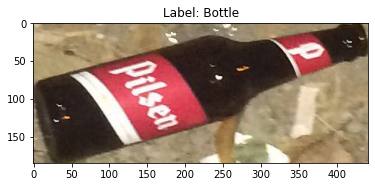

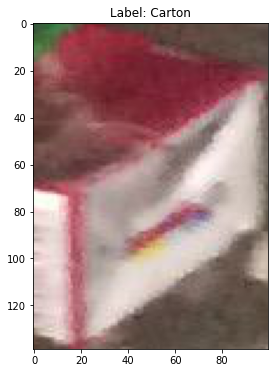

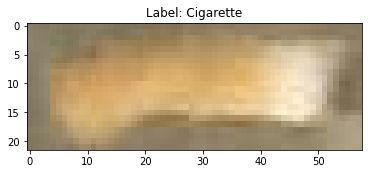

In [110]:
for box in string_3:
    label = box[0]
    x_center = np.float64(box[1]) * width
    y_center = np.float64(box[2]) * height
    width_n = np.float64(box[3]) * width
    height_n = np.float64(box[4]) * height
    left = x_center - width_n/2
    top = y_center - height_n/2
    right = x_center + width_n/2
    bottom = y_center + height_n/2

    slice = im.crop((left, top, right, bottom))
    plt.figure(figsize=(6,6))
    plt.title(f'Label: {class_dict_[int(label)]}')
    plt.imshow(slice)

In [111]:
import os
from PIL import Image

In [112]:
# Choose image
img_name = "batch_7_000096"

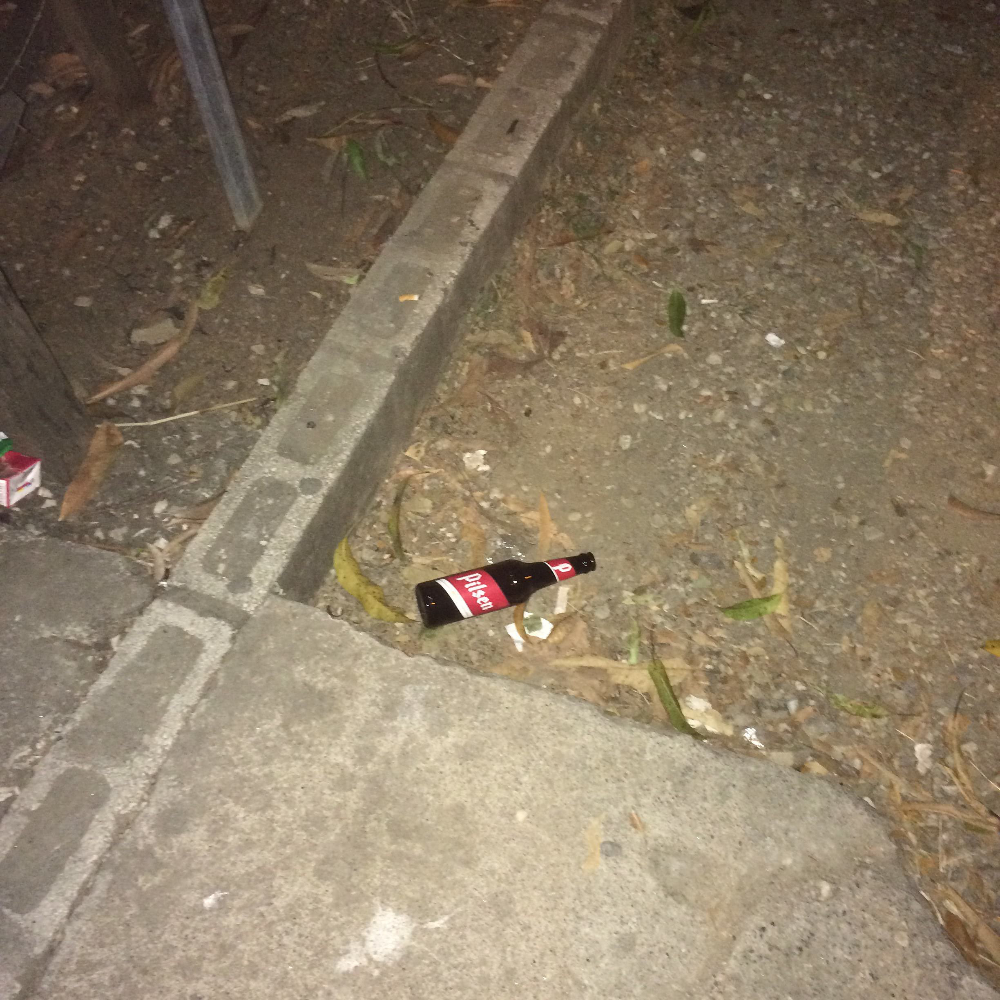

In [113]:
root_dir = os.getcwd()
im = Image.open(root_dir + '\\data\\taco\\images\\train\\' + f'{img_name}'+ '.jpg')
im

In [114]:
f = open(root_dir + '\\data\\taco\\labels\\train\\'+f'{img_name}'+'.txt', "r")
string = f.readlines()
string_2 = [line[0:-1] for line in string]
string_3 = [line.split(' ') for line in string_2]

In [115]:
width, height = im.size
print(width, height)

2448 2448


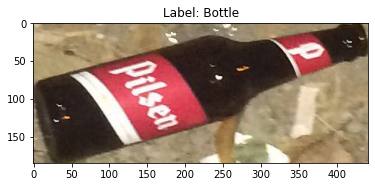

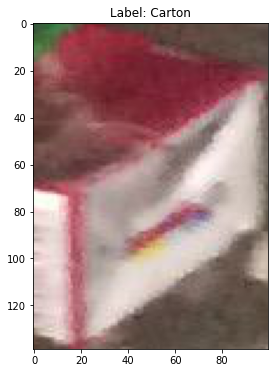

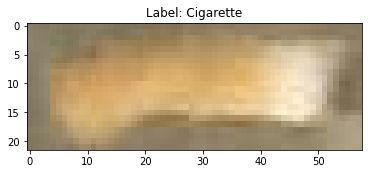

In [116]:
for box in string_3:
    label = box[0]
    x_center = np.float64(box[1]) * width
    y_center = np.float64(box[2]) * height
    width_n = np.float64(box[3]) * width
    height_n = np.float64(box[4]) * height
    left = x_center - width_n/2
    top = y_center - height_n/2
    right = x_center + width_n/2
    bottom = y_center + height_n/2

    slice = im.crop((left, top, right, bottom))
    plt.figure(figsize=(6,6))
    plt.title(f'Label: {class_dict_[int(label)]}')
    plt.imshow(slice)